### Imports and Setup

In [1]:
import pickle,gzip,math,os,time,shutil,torch,random,timm,torchvision,io,PIL
import fastcore.all as fc,matplotlib as mpl,numpy as np,matplotlib.pyplot as plt
from collections.abc import Mapping
from pathlib import Path
from operator import attrgetter,itemgetter
from functools import partial
from copy import copy
from contextlib import contextmanager

import torchvision.transforms.functional as TF,torch.nn.functional as F
from torchvision import transforms
from torch import tensor,nn,optim
from torch.utils.data import DataLoader,default_collate
from torch.nn import init
from torch.optim import lr_scheduler
from torcheval.metrics import MulticlassAccuracy
from datasets import load_dataset,load_dataset_builder
from fastcore.foundation import L, store_attr

from miniai.datasets import *
from miniai.conv import *
from miniai.learner import *
from miniai.activations import *
from miniai.init import *
from miniai.sgd import *
from miniai.resnet import *

In [2]:
# Image URLs for demos. Change as desired.
face_url = "https://images.pexels.com/photos/2690323/pexels-photo-2690323.jpeg?w=256"
spiderweb_url = "https://images.pexels.com/photos/34225/spider-web-with-water-beads-network-dewdrop.jpg?w=256"

### Loading Images

In [3]:
def download_image(url):
    imgb = fc.urlread(url, decode=False) 
    return torchvision.io.decode_image(tensor(list(imgb), dtype=torch.uint8)).float()/255.

content_im.shape: torch.Size([3, 256, 256])


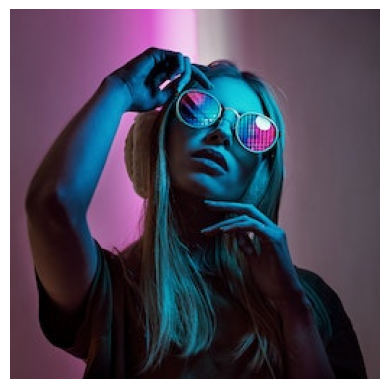

In [4]:
content_im = download_image(face_url).to(def_device)
print('content_im.shape:', content_im.shape)
show_image(content_im);

In [5]:
content_im.min(),content_im.max() # Check bounds

(tensor(0., device='cuda:0'), tensor(1., device='cuda:0'))

In [6]:
# Create a dummy dataloader
class LengthDataset():
    def __init__(self, length=1): self._length=length
    def __len__(self): return self._length
    def __getitem__(self, idx): return 0, 0

def get_dummy_dls(length=100):
    return DataLoaders(DataLoader(LengthDataset(length), batch_size=1),
            DataLoader(LengthDataset(length), batch_size=1))

In [7]:
# Create a model where the pixels are all parameters of the model and hence can be optimised
class TensorModel(nn.Module):
    def __init__(self, t):
        super().__init__()
        self.t = nn.Parameter(t.clone())
    def forward(self, x=0): return self.t

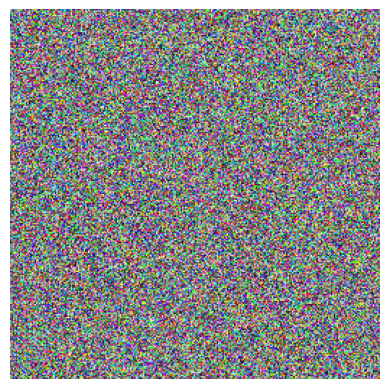

In [8]:
model = TensorModel(torch.rand_like(content_im))
show_image(model());

In [9]:
# Overwrite the default predict and get_loss methods of TrainCB
class ImageOptCB(TrainCB):
    # Make the predictions simply the image in its latest state
    def predict(self, learn): learn.preds = learn.model()
    # Pass only the preds to the loss function (which gets the target from the
    # loss function definition
    def get_loss(self, learn): learn.loss = learn.loss_func(learn.preds)

In [10]:
def loss_fn_mse(im):
    return F.mse_loss(im, content_im)

# Seed the model with random noise
model = TensorModel(torch.rand_like(content_im))
cbs = [ImageOptCB(), ProgressCB(), MetricsCB(), DeviceCB()]
learn = Learner(model, get_dummy_dls(100), loss_fn_mse, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)

loss,epoch,train
0.041,0,train
0.001,0,eval


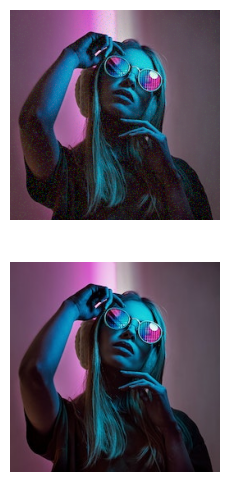

In [11]:
# Result (left) vs target image (right):
show_images([learn.model().clip(0, 1), content_im]);

In [12]:
# Catch interim results using a callback
class ImageLogCB(Callback):
    # make sure it runs after progress callback
    order = ProgressCB.order+1
    def __init__(self, log_every=10): 
        """ Define when to log and initialise logger
        """
        store_attr()
        self.images=[]
        # initialize counter
        self.i=0
        
    def after_batch(self, learn): 
        """ log results
        """
        if self.i%self.log_every==0:
            self.images.append(to_cpu(learn.preds.clip(0, 1)))
        self.i += 1

    def after_fit(self, learn): 
        """ Plot results
        """
        show_images(self.images)
        pass
    

loss,epoch,train
0.028,0,train
0.000,0,eval


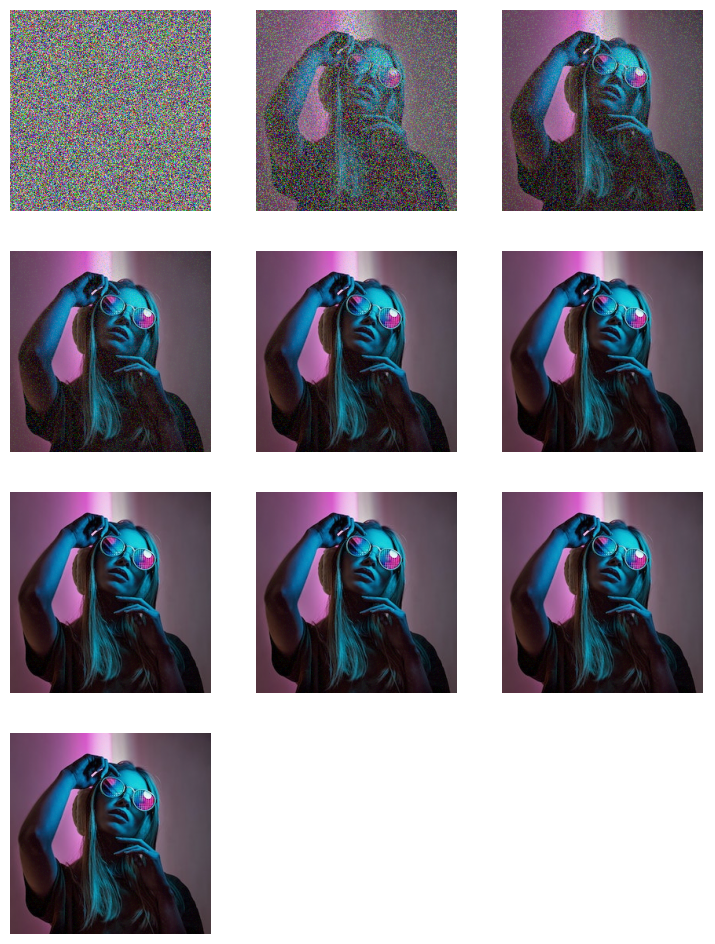

In [13]:
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), loss_fn_mse, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(30)])

### Getting features from VGG 

In [14]:
print(timm.list_models('*vgg*'))

['repvgg_a2', 'repvgg_b0', 'repvgg_b1', 'repvgg_b1g4', 'repvgg_b2', 'repvgg_b2g4', 'repvgg_b3', 'repvgg_b3g4', 'vgg11', 'vgg11_bn', 'vgg13', 'vgg13_bn', 'vgg16', 'vgg16_bn', 'vgg19', 'vgg19_bn']


In [15]:
vgg16 = timm.create_model('vgg16', pretrained=True).to(def_device).features

In [16]:
vgg16

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

It is necessary to normalise images to match those from Imagenet

In [17]:
imagenet_mean = tensor([0.485, 0.456, 0.406])
imagenet_std = tensor([0.229, 0.224, 0.225])

To allow the image to be normalised using broadcasting we need to reshape things

In [18]:
def normalize(im):
    imagenet_mean = tensor([0.485, 0.456, 0.406])[:, None, None].to(im.device)
    imagenet_std = tensor([0.229, 0.224, 0.225])[:, None, None].to(im.device)
    return (im - imagenet_mean) / imagenet_std

In [19]:
normalize(content_im).min(), normalize(content_im).max()

(tensor(-2.1179, device='cuda:0'), tensor(2.6400, device='cuda:0'))

In [20]:
normalize(content_im).mean(dim=(1,2))

tensor([-0.9737, -0.9624, -0.4228], device='cuda:0')

In [21]:
normalize(content_im).std(dim=(1,2))

tensor([0.9325, 0.7661, 0.9849], device='cuda:0')

All of the channels are lower than the norm by this is a dark image and has a lot of blue, which is what that channel is not so low

In [22]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

In [23]:
normalize(content_im).min(), normalize(content_im).max()

(tensor(-2.1179, device='cuda:0'), tensor(2.6400, device='cuda:0'))

The mean is a lot lower and the std is higher than imagenet

Having proven the normalize works we can now use the torchvision version

###  Extract intermediate layer representations

In [24]:
# Define layers to extract feature
layers_to_extract = [11, 18, 25]

In [25]:
def append_acts(hook, mod, inp, outp):
    if not hasattr(hook,'acts'): hook.activations = []
    acts = outp
    hook.activations.append(acts)

In [26]:
hooks=[]
for layer in layers_to_extract:
    hook = Hook(vgg16[layer], append_acts)
    hooks.append(hook)

In [27]:
def calc_features(imgs, layers_to_extract):
    x=normalize(imgs)
    # Add hooks
    hooks=[]
    for layer in layers_to_extract:
        hook = Hook(vgg16[layer], append_acts)
        hooks.append(hook)
    for layer in vgg16[:layers_to_extract[-1]+1]:
        x = layer(x)
    #preds = vgg16(x)
    acts = []
    #import pdb; pdb.set_trace()
    for hook in hooks:
        acts.append(hook.activations[0])
        hook.remove()
    return acts
                     

In [28]:
acts = calc_features(content_im, layers_to_extract)

In [29]:
len(acts), acts[0][0].shape, acts[1][0].shape, acts[2][0].shape

(3, torch.Size([64, 64]), torch.Size([32, 32]), torch.Size([16, 16]))

### Optimizing the image with Content Loss 

In [30]:
# Create a loss function that will compare the activations from one image with that
# from another at several layers

In [50]:
class ContentLossToTarget():
    
    def __init__(self, target_im, target_layers=(18, 25)):
        store_attr()
        with torch.no_grad():
            self.target_features = calc_features(target_im, layers_to_extract=target_layers)
    def __call__(self, input_im):
        input_feat = calc_features(input_im, self.target_layers)
        loss=0
        for featx, featy in zip(input_feat, self.target_features):
            loss += (featx-featy).pow(2).mean()
        return loss

In [51]:
perceptual_loss_func = ContentLossToTarget(content_im, (18, 25))
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), perceptual_loss_func, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)


loss,epoch,train
5.394,0,train
1.657,0,eval


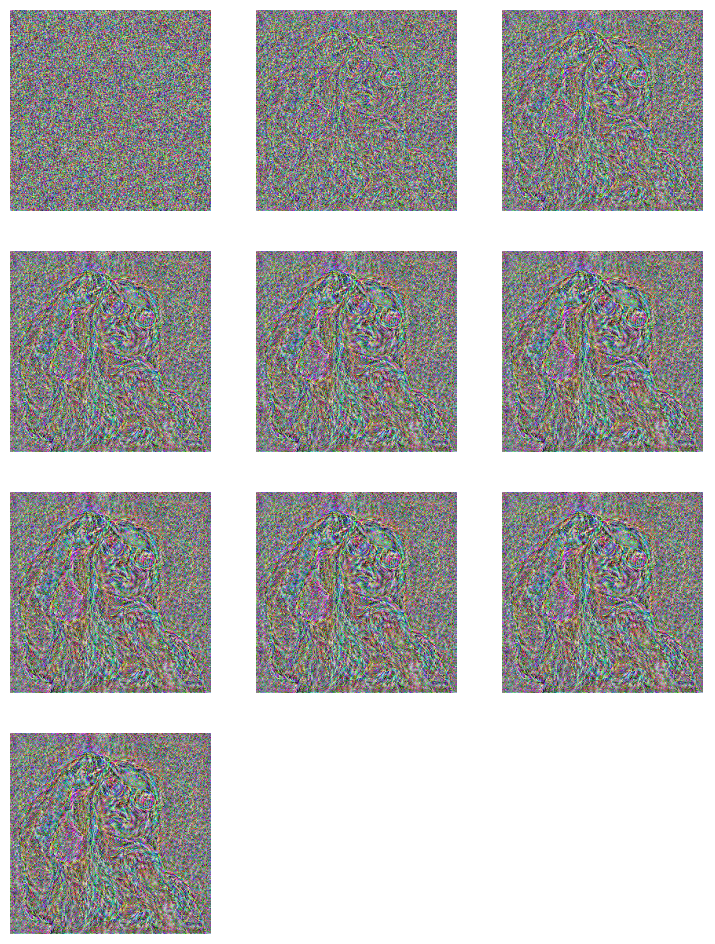

In [33]:
learn.fit(1, cbs=[ImageLogCB(30)])

#### Changing the layers to change the emphasis of the image creation

loss,epoch,train
2.382,0,train
0.377,0,eval


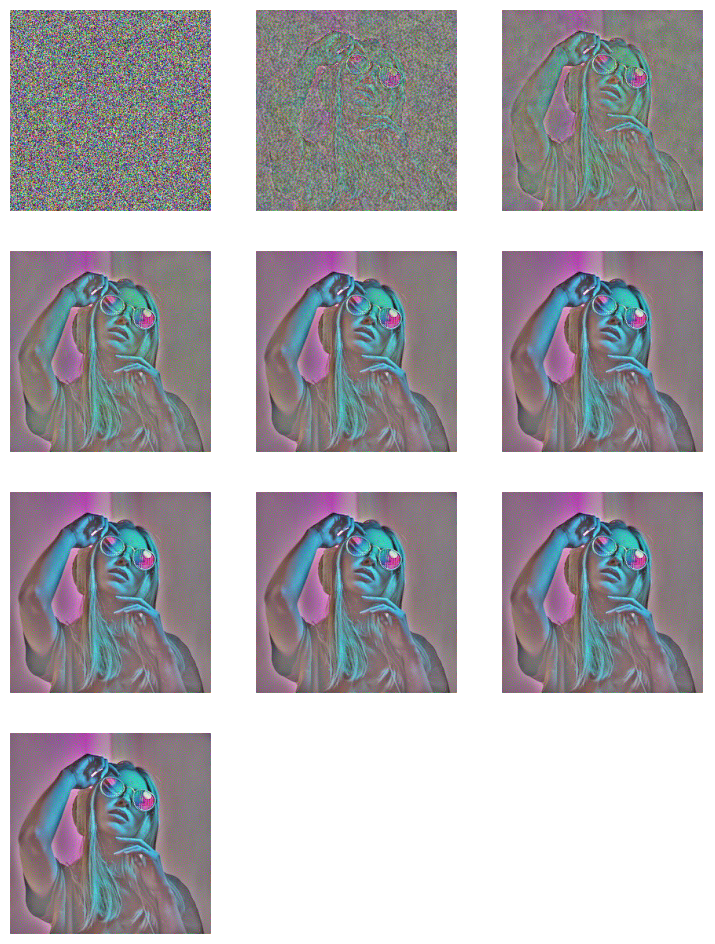

In [34]:
perceptual_loss_func = ContentLossToTarget(content_im, target_layers=(1, 6))
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), perceptual_loss_func, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(log_every=30)])

### The Gram Matrix

So, we know how to extract feature maps. The next thing we'd like to do is find a way to capture the **style** of an input image, based on those early layers and the kinds of textural feature that they learn. Unfortunately, we can't just compare the feature maps from some early layers since these 'maps' encode information spatially - which we don't want!

<img title="" alt="" src="images/feature_map_extraction.png">

So, we need a way to measure what **kinds** of style features are present, and ideally which kinds occur together, without worrying about **where** these features occur in the image. 

Enter something called the Gram Matrix. The idea here is that we'll measure the **correlation** between features. Given a feature map with `f` features in an `h` x `w` grid, we'll flatten out the spatial component and then for every feature we'll take the dot product of that row with itself, giving an `f` x `f` matrix as the result. Each entry in this matrix quantifies how correlated the relevant pair of features are and how frequently they occur - exactly what we want. In this diagram each feature is represented as a colored dot.

<img title="" alt="" src="images/gram_calculation.png">

Re-creating the diagram operations in code:

In [35]:
t = tensor([[0, 1, 0, 1, 1, 0, 0, 1, 1],
            [0, 1, 0, 1, 0, 0, 0, 0, 1],
            [1, 0, 1, 1, 1, 1, 1, 1, 0],
            [1, 0, 1, 1, 0, 1, 1, 0, 0]])

In [36]:
torch.einsum('fs, gs -> fg', t, t)

tensor([[5, 3, 3, 1],
        [3, 3, 1, 1],
        [3, 1, 7, 5],
        [1, 1, 5, 5]])

In [37]:
t.matmul(t.T) # Alternate approach

tensor([[5, 3, 3, 1],
        [3, 3, 1, 1],
        [3, 1, 7, 5],
        [1, 1, 5, 5]])

#### Using the Gram Matrix

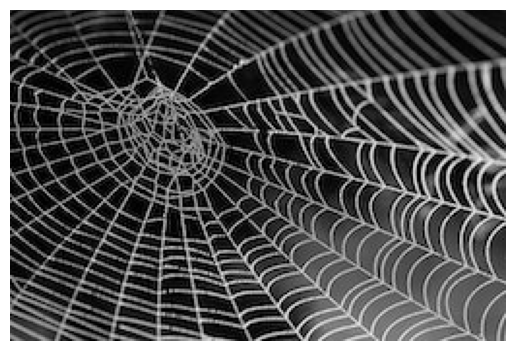

In [38]:
style_im = download_image(spiderweb_url).to(def_device)
show_image(style_im);

In [52]:
def calc_grams(img, target_layers=(1, 6, 11, 18, 25)):
    return L(torch.einsum('chw, dhw -> cd', x, x) / (x.shape[-2]*x.shape[-1]) # 'bchw, bdhw -> bcd' if batched
            for x in calc_features(img, target_layers))

In [53]:
style_grams = calc_grams(style_im)

In [54]:
[g.shape for g in style_grams]

[torch.Size([64, 64]),
 torch.Size([128, 128]),
 torch.Size([256, 256]),
 torch.Size([512, 512]),
 torch.Size([512, 512])]

In [55]:
style_grams.attrgot('shape') # The magic of fastcore's L

(#5) [torch.Size([64, 64]),torch.Size([128, 128]),torch.Size([256, 256]),torch.Size([512, 512]),torch.Size([512, 512])]

In [56]:
class StyleLossToTarget():
    
    def __init__(self, target_im, target_layers=(1, 6, 11, 18, 25)):
        fc.store_attr()
        with torch.no_grad():
            self.target_grams = calc_grams(target_im, target_layers=target_layers)
    def __call__(self, input_im):
        input_feat = calc_grams(input_im, self.target_layers)
        loss=0
        for featx, featy in zip(input_feat, self.target_grams):
            loss += (featx-featy).pow(2).mean()
        return loss

In [57]:
style_loss = StyleLossToTarget(style_im)

In [58]:
style_loss(content_im)

tensor(504.3134, device='cuda:0', grad_fn=<AddBackward0>)

### Style Transfer 

In [59]:
model = TensorModel(content_im)
style_loss = StyleLossToTarget(style_im)
content_loss = ContentLossToTarget(content_im)
def combined_loss(x):
    return style_loss(x) + content_loss(x)
learn = Learner(model, get_dummy_dls(150), combined_loss, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)

loss,epoch,train
85.431,0,train
49.620,0,eval


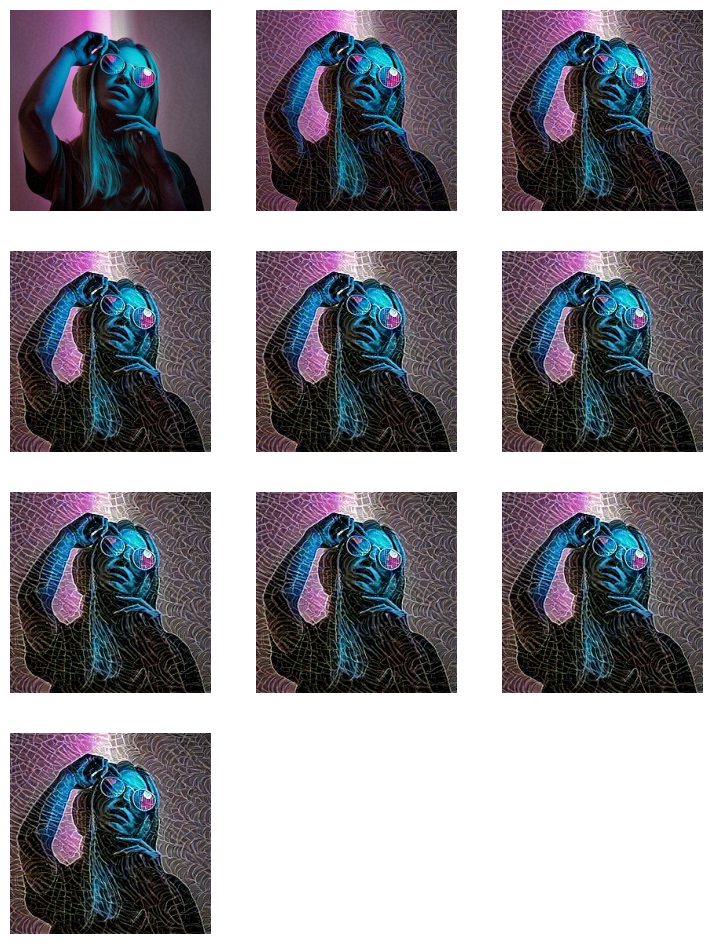

In [60]:
learn.fit(1, cbs=[ImageLogCB(30)])

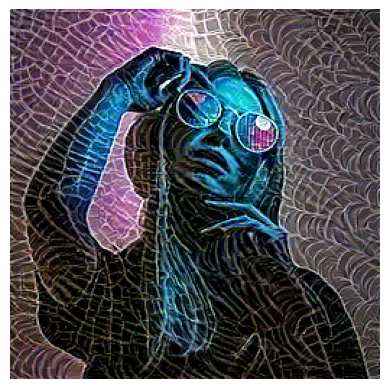

In [61]:
show_image(learn.model().clip(0, 1));

Starting with a random image and changing the weights

loss,epoch,train
149.931,0,train
31.077,0,eval


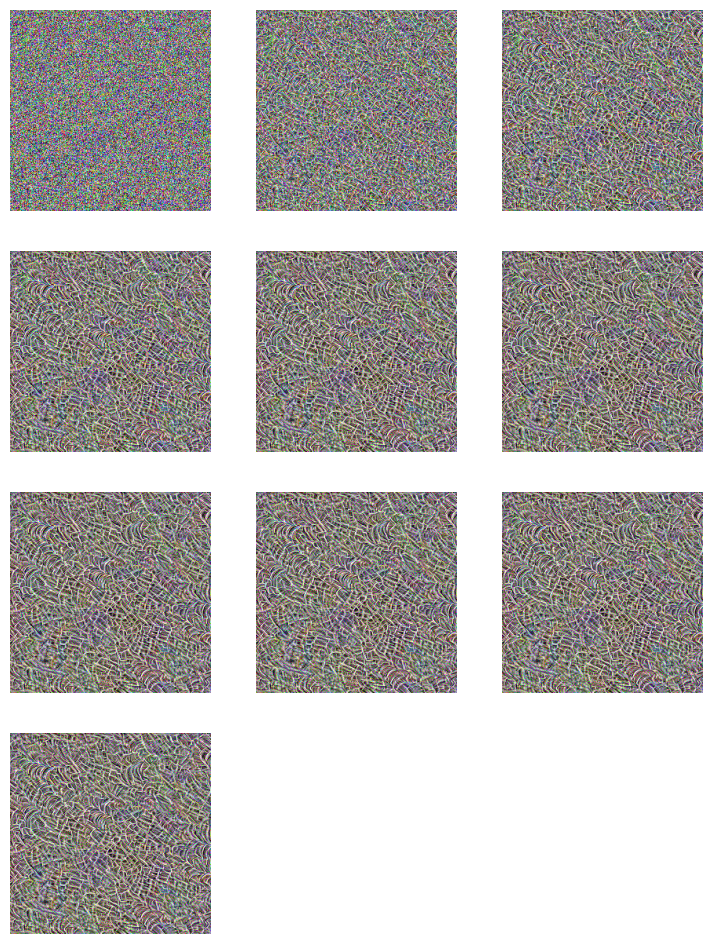

In [69]:
model = TensorModel(torch.rand_like(content_im))
style_loss = StyleLossToTarget(style_im, target_layers=(1, 6, 11, 18, 25))
content_loss = ContentLossToTarget(content_im, target_layers=(1,6))
def combined_loss(x):
    return style_loss(x) + 0.75*content_loss(x)
learn = Learner(model, get_dummy_dls(150), combined_loss, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(30)])

It seems that the content loss needs more specific information to re-create the image.  Adding content later in the model will add more "features"

loss,epoch,train
49.574,0,train
40.470,0,eval


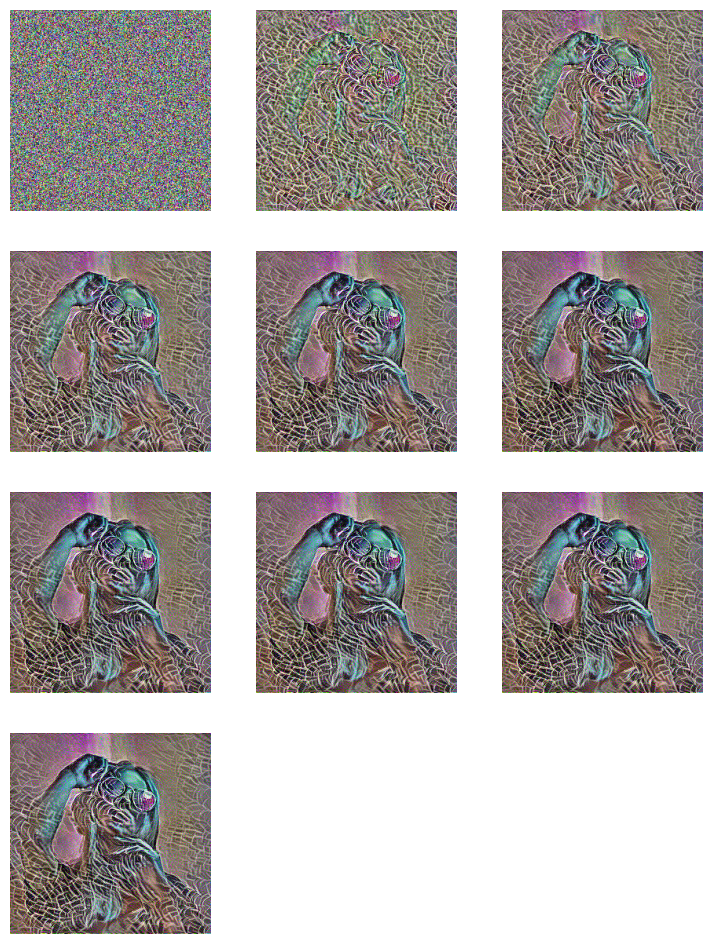

In [74]:
model = TensorModel(torch.rand_like(content_im))
style_loss = StyleLossToTarget(style_im, target_layers=(1, 6, 11, 18, 25))
content_loss = ContentLossToTarget(content_im, target_layers=(6, 18, 25))
def combined_loss(x):
    return style_loss(x)*0.2 + content_loss(x)
learn = Learner(model, get_dummy_dls(300), combined_loss, lr=5e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(60)])

loss,epoch,train
93.639,0,train
64.132,0,eval


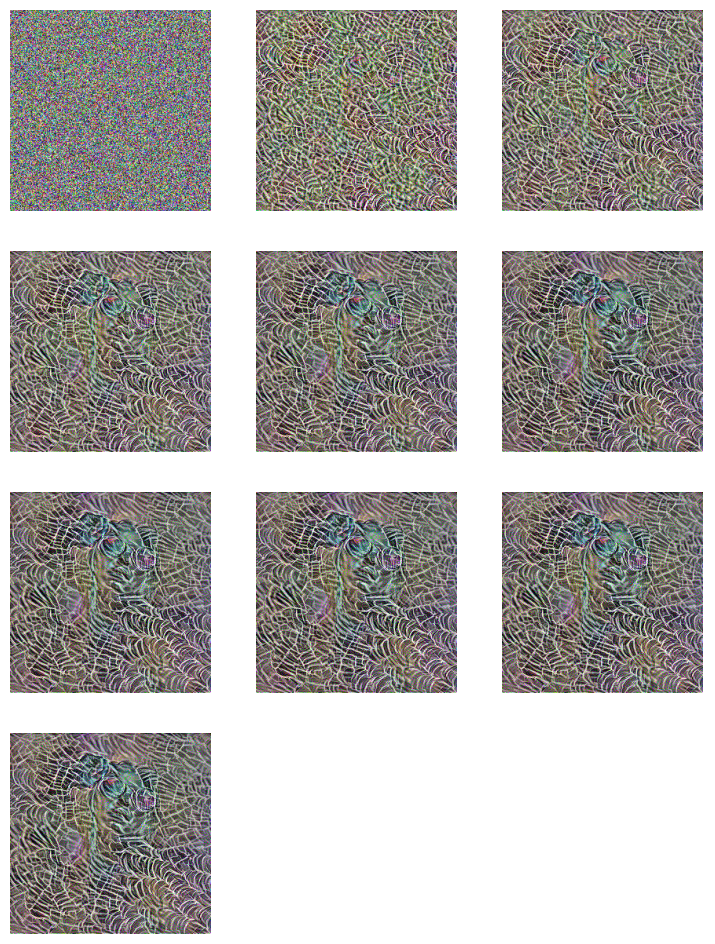

In [75]:
model = TensorModel(torch.rand_like(content_im))
style_loss = StyleLossToTarget(style_im, target_layers=(1, 6, 11, 18, 25))
content_loss = ContentLossToTarget(content_im, target_layers=(6, 18, 25))
def combined_loss(x):
    return style_loss(x) + content_loss(x)
learn = Learner(model, get_dummy_dls(300), combined_loss, lr=5e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(60)])

Clearly the style loss is rather dominant unless its value is reduced.  Going back to the previous weighting it will be interesting to remove the last layer of the style loss

loss,epoch,train
48.014,0,train
38.874,0,eval


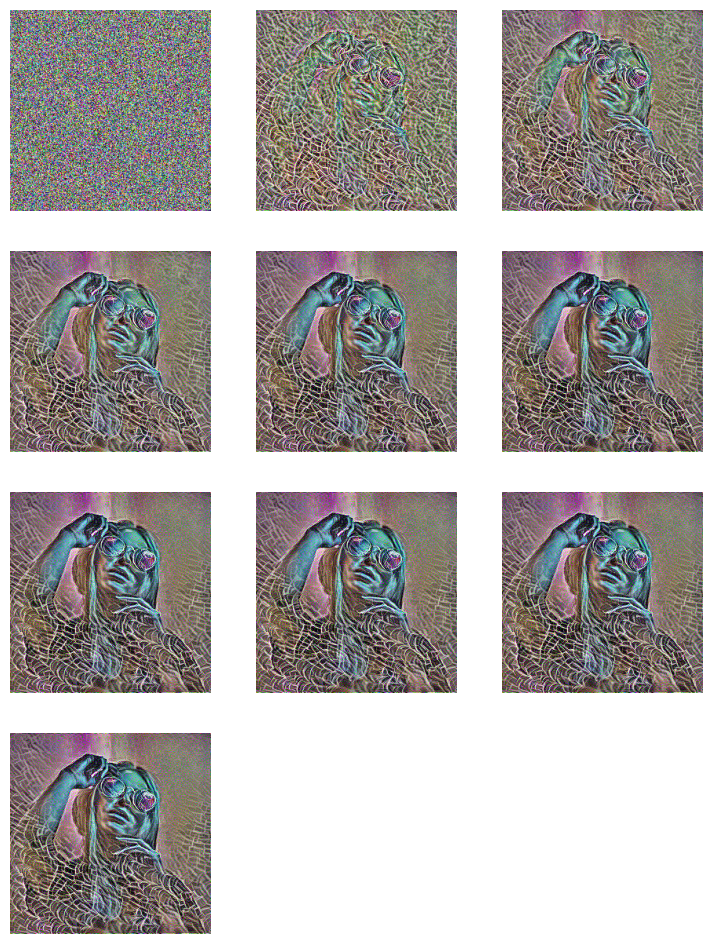

In [76]:
model = TensorModel(torch.rand_like(content_im))
style_loss = StyleLossToTarget(style_im, target_layers=(1, 6, 11, 18))
content_loss = ContentLossToTarget(content_im, target_layers=(6, 18, 25))
def combined_loss(x):
    return style_loss(x)*0.2 + content_loss(x)
learn = Learner(model, get_dummy_dls(300), combined_loss, lr=5e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(60)])

and removing the next style layer

loss,epoch,train
47.657,0,train
38.068,0,eval


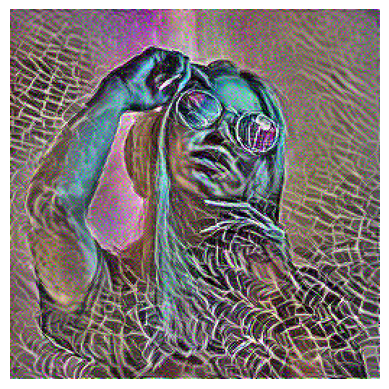

In [81]:
model = TensorModel(torch.rand_like(content_im))
style_loss = StyleLossToTarget(style_im, target_layers=(1, 6, 11, 18))
content_loss = ContentLossToTarget(content_im, target_layers=(6, 18, 25))
def combined_loss(x):
    return style_loss(x)*0.2 + content_loss(x)
learn = Learner(model, get_dummy_dls(300), combined_loss, lr=5e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)
show_image(learn.model().clip(0, 1));

Compared to starting with the specific image we are generating the essence but don't have the rich colors of the starting image.

loss,epoch,train
49.098,0,train
39.410,0,eval


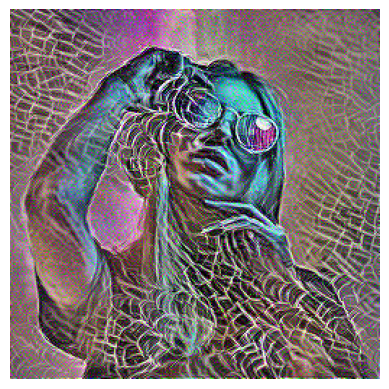

In [84]:
model = TensorModel(torch.rand_like(content_im))
style_loss = StyleLossToTarget(style_im, target_layers=(1, 6, 11, 18))
content_loss = ContentLossToTarget(content_im, target_layers=(1, 6, 18, 25, 29))
def combined_loss(x):
    return style_loss(x)*0.2 + content_loss(x)
learn = Learner(model, get_dummy_dls(300), combined_loss, lr=5e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)
show_image(learn.model().clip(0, 1));

It seems difficult to recreate the colors of the original image

loss,epoch,train
7.340,0,train
5.524,0,eval


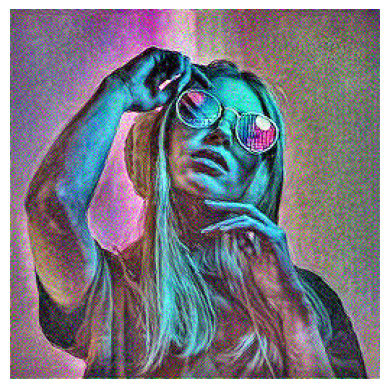

In [85]:
model = TensorModel(torch.rand_like(content_im))
style_loss = StyleLossToTarget(style_im, target_layers=(1, 6))
content_loss = ContentLossToTarget(content_im, target_layers=(1, 6, 18, 25, 29))
def combined_loss(x):
    return style_loss(x)*0.2 + content_loss(x)
learn = Learner(model, get_dummy_dls(300), combined_loss, lr=5e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)
show_image(learn.model().clip(0, 1));

Removing the latter layers of the style loss has very much removed the spiders web.

loss,epoch,train
47.924,0,train
37.816,0,eval


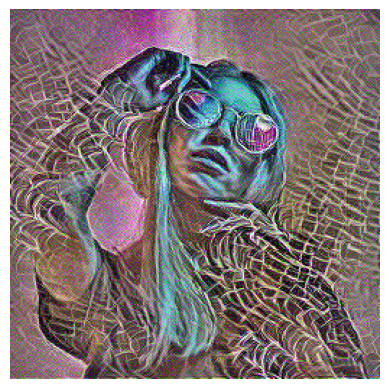

In [86]:
model = TensorModel(torch.rand_like(content_im))
style_loss = StyleLossToTarget(style_im, target_layers=(11, 18))
content_loss = ContentLossToTarget(content_im, target_layers=(1, 6, 18, 25, 29))
def combined_loss(x):
    return style_loss(x)*0.2 + content_loss(x)
learn = Learner(model, get_dummy_dls(300), combined_loss, lr=5e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)
show_image(learn.model().clip(0, 1));

This would suggest that the latter layers are more important to teh style loss than the earlier layers